In [1]:
# Numpy
import numpy as np
# Pandas
import pandas as pd
# Plotting
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
from pandas.plotting import scatter_matrix
# Statistics
from scipy import stats
from scipy.stats import pearsonr
# Split
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
# Preprocessing
from sklearn.preprocessing import StandardScaler, QuantileTransformer, quantile_transform
from sklearn.decomposition import PCA
# Pipeline
from sklearn.pipeline import make_pipeline
# Feature selection
from sklearn.feature_selection import f_regression, SelectKBest
# Models
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
import xgboost as xgb
# Metrics
from sklearn.metrics import (make_scorer, 
            mean_squared_error, mean_absolute_error, r2_score)
# Correlation & hierarchy clustering
from scipy.cluster import hierarchy
from scipy.spatial import distance

In [2]:
# Set plots size
plt.rcParams['figure.figsize'] = (10, 4)

## Getting the Data

In [3]:
df = pd.read_csv('house.csv')
# Print No of rows & columns
print(f'No of rows: {df.shape[0]}\nNo of columns: {df.shape[1]}')
# Show first 5 rows
df.head()

No of rows: 21613
No of columns: 22


,id,date,price,price_bin,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,0,3,1.00,1180,5650,1.0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,0,3,2.25,2570,7242,2.0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,0,2,1.00,770,10000,1.0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,0,4,3.00,1960,5000,1.0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,0,3,2.00,1680,8080,1.0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
# Check data
df.info()
# Check the missing data
print(f'Missing cells: {df.isnull().sum().sum()}')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   price_bin      21613 non-null  int64  
 4   bedrooms       21613 non-null  int64  
 5   bathrooms      21613 non-null  float64
 6   sqft_living    21613 non-null  int64  
 7   sqft_lot       21613 non-null  int64  
 8   floors         21613 non-null  float64
 9   waterfront     21613 non-null  int64  
 10  view           21613 non-null  int64  
 11  condition      21613 non-null  int64  
 12  grade          21613 non-null  int64  
 13  sqft_above     21613 non-null  int64  
 14  sqft_basement  21613 non-null  int64  
 15  yr_built       21613 non-null  int64  
 16  yr_renovated   21613 non-null  int64  
 17  zipcode        21613 non-null  int64  
 18  lat   

No missing data

In [5]:
# Describe & inspect dataset
df.describe() 
# Let`s inspect the columns
df.columns 
# Print unique values
print(df.nunique())

id               21436
date               372
price             3625
price_bin            2
bedrooms            13
bathrooms           30
sqft_living       1038
sqft_lot          9782
floors               6
waterfront           2
view                 5
condition            5
grade               12
sqft_above         946
sqft_basement      306
yr_built           116
yr_renovated        70
zipcode             70
lat               5034
long               752
sqft_living15      777
sqft_lot15        8689
dtype: int64


# Dataset Preparation

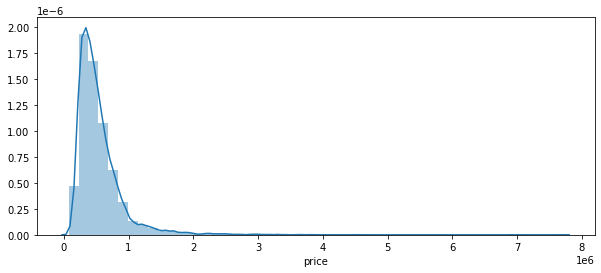

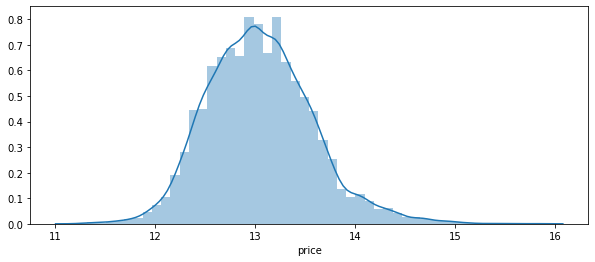

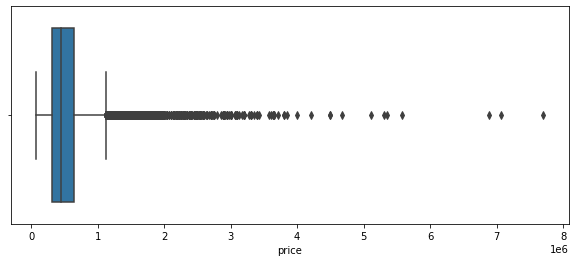

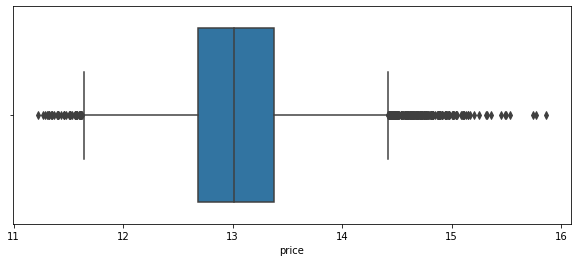

Max price of house is: 7700000.0
Min price of house is: 75000.0
Median price of house is: 450000.0


In [6]:
# Visualizing house prices
sns.distplot(df['price'])
plt.show()
#log data price
sns.distplot(np.log(df['price']))
plt.show()
sns.boxplot(df['price'])
plt.show()
# log data price
sns.boxplot(np.log(df['price']))
plt.show()
# Print price max
print('Max price of house is:',df['price'].max())
# Print price min
print('Min price of house is:',  df['price'].min())
# Print price median
print('Median price of house is:',  df['price'].median())

We can visualize that most of the prices 
are between 0 and around 1M with few outliers close to 8 million

Condition of house (count): 
 3    14031
4     5679
5     1701
2      172
1       30
Name: condition, dtype: int64


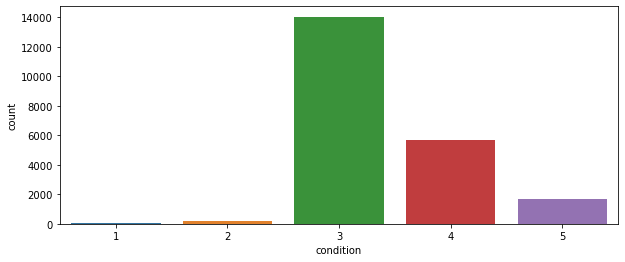

In [7]:
# Price of house and their condition
print('Condition of house (count): \n',df['condition'].value_counts())
sns.countplot(df['condition'])
plt.show()

Numbers of floors (count): 
 1.0    10680
2.0     8241
1.5     1910
3.0      613
2.5      161
3.5        8
Name: floors, dtype: int64


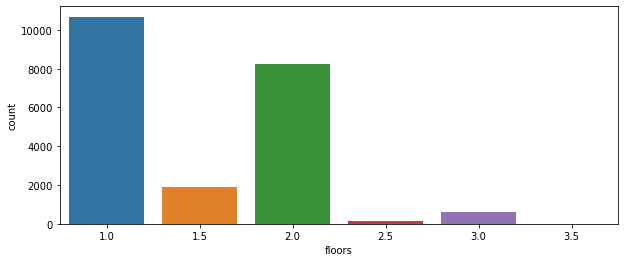

In [8]:
# Price of house and numbers of floors
print('Numbers of floors (count): \n',df['floors'].value_counts())
sns.countplot(df['floors'])
plt.show()

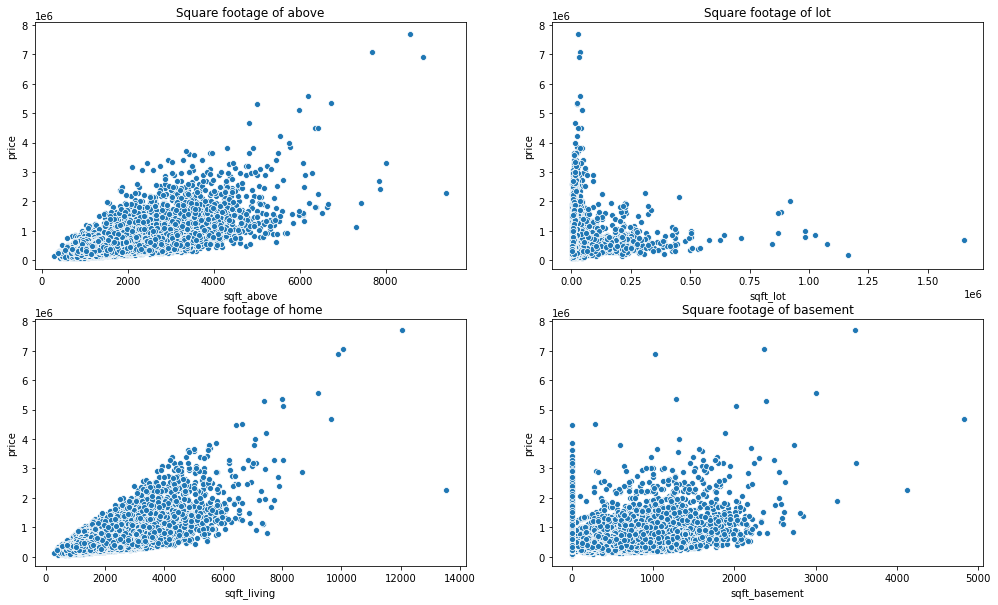

In [9]:
# Visualizing square footage of home,lot,above and basement
fig = plt.figure(figsize=(17,10))
# Square footage of above
fig.add_subplot(2,2,1)
sns.scatterplot(df['sqft_above'], df['price'])
ax = plt.gca()
ax.set_title('Square footage of above')
# Square footage of lot
fig.add_subplot(2,2,2)
sns.scatterplot(df['sqft_lot'],df['price'])
ax = plt.gca()
ax.set_title('Square footage of lot')
# Square footage of home
fig.add_subplot(2,2,3)
sns.scatterplot(df['sqft_living'],df['price'])
ax = plt.gca()
ax.set_title('Square footage of home')
# Square footage of basement
fig.add_subplot(2,2,4)
sns.scatterplot(df['sqft_basement'],df['price'])
ax = plt.gca()
ax.set_title('Square footage of basement')
plt.show()

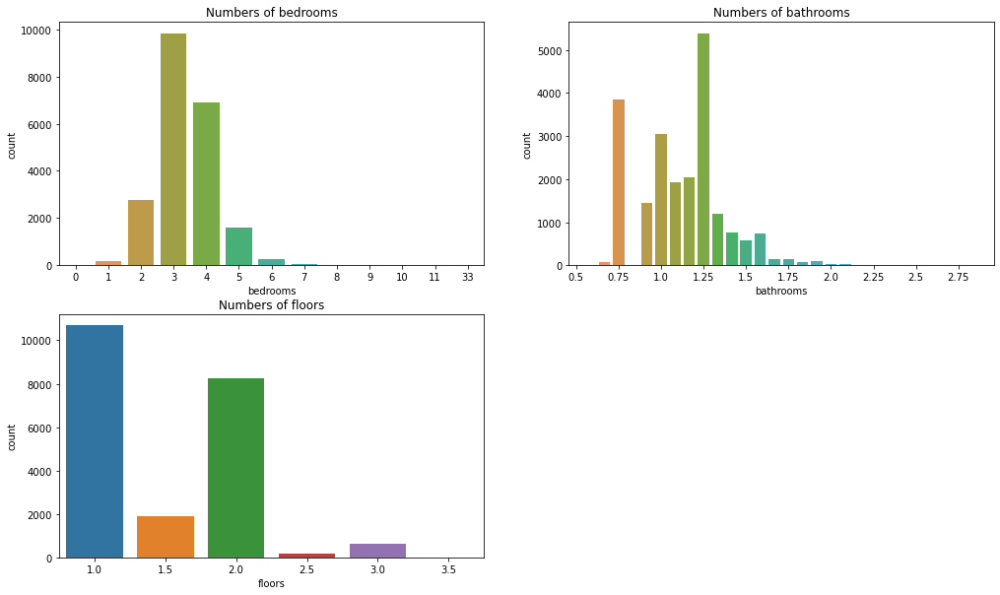

In [10]:
# Visualizing numbers of bedrooms,bathrooms,floors
fig = plt.figure(figsize=(17,10))
# Numbers of bedrooms
fig.add_subplot(2,2,1)
sns.countplot(df['bedrooms'])
ax = plt.gca()
ax.set_title('Numbers of bedrooms')
# Numbers of bathrooms
fig.add_subplot(2,2,2)
plot = sns.countplot(df['bathrooms'])
loc = plticker.MultipleLocator(base=3)
ax = plt.gca()
ax.xaxis.set_major_locator(loc)
ax.set_title('Numbers of bathrooms')
# Numbers of floors
fig.add_subplot(2,2,3)
sns.countplot(df['floors'])
ax = plt.gca()
ax.set_title('Numbers of floors')
plt.show()

Check the correaltion between prices vs. square footage of 
home and above

In [11]:
# Calculate Pearson's correlation prices vs. Square footage of home
corr, _ = pearsonr(df['price'], df['sqft_living'])
print('Pearsons correlation prices vs. square footage of home: %.3f' % corr)
# Calculate Pearson's correlation prices vs. Square footage of above
corr, _ = pearsonr(df['price'], df['sqft_above'])
print('Pearsons correlation prices vs. square footage of above: %.3f' % corr)

Pearsons correlation prices vs. square footage of home: 0.702
Pearsons correlation prices vs. square footage of above: 0.606


In [12]:
# Correlation & hierarchy clustering
def corr_mat(df):
    corr_matrix = df.corr()
    correlations_array = np.asarray(corr_matrix)
    linkage = hierarchy.linkage(distance.pdist(correlations_array), method='average')
    g = sns.clustermap(corr_matrix, row_linkage=linkage, col_linkage=linkage, 
                    row_cluster=True, col_cluster=True, 
                    figsize=(10,10), cmap='Greens', fmt='.2f')
    return g

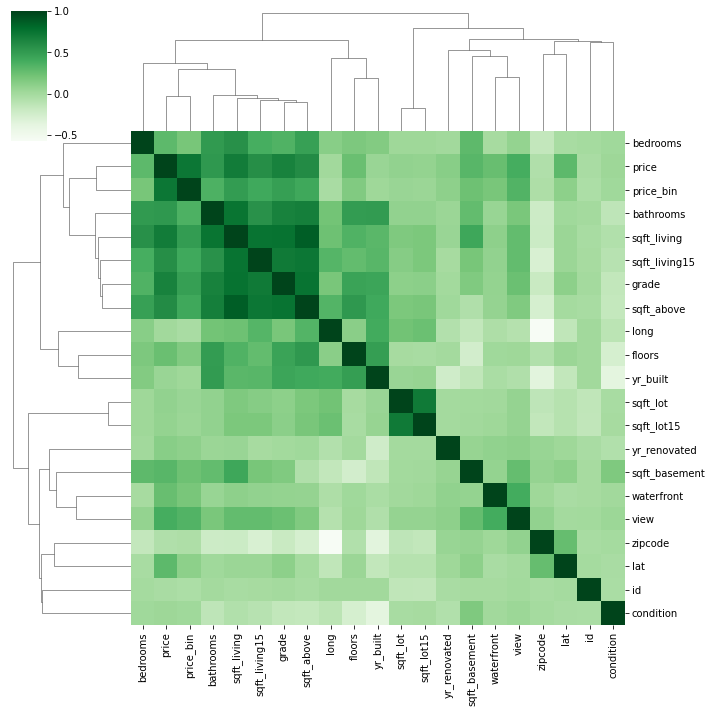

In [13]:
# Correlation matrix
plot = corr_mat(df)
plot

In [14]:
# Correlation between price and other variables
corr_matrix = df.corr()
corr_matrix["price"].sort_values(ascending=False)

price            1.000000
price_bin        0.731709
sqft_living      0.702044
grade            0.667463
sqft_above       0.605566
sqft_living15    0.585374
bathrooms        0.525134
view             0.397346
sqft_basement    0.323837
bedrooms         0.308338
lat              0.306919
waterfront       0.266331
floors           0.256786
yr_renovated     0.126442
sqft_lot         0.089655
sqft_lot15       0.082456
yr_built         0.053982
condition        0.036392
long             0.021571
id              -0.016797
zipcode         -0.053168
Name: price, dtype: float64

In [ ]:
# Calculate and show pairplot
attributes = ['price', 'sqft_living', 'grade', 'sqft_above', 'bathrooms' ]
scatter_matrix(df[attributes], figsize=(17,10));

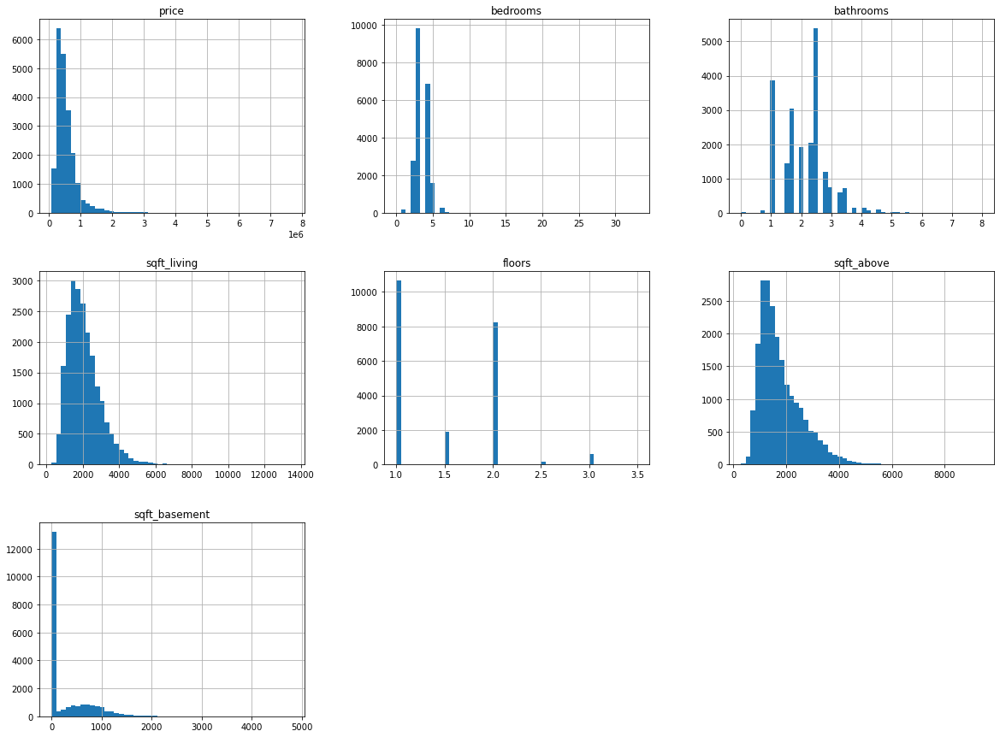

In [15]:
# Look at the distribution of data
dist = df[['price', 'bedrooms', 'bathrooms', 'sqft_living', 'floors', 'sqft_above', 'sqft_basement']]
dist.hist(bins = 50, figsize=(20,15))
plt.show()

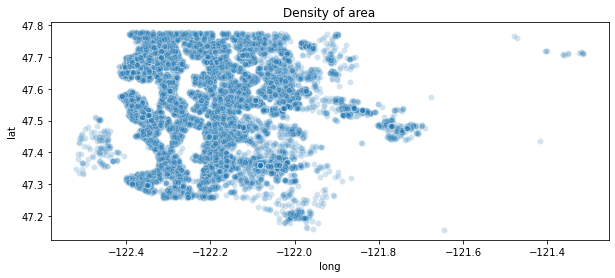

In [16]:
# Explore the high density area
sns.scatterplot(df['long'],df['lat'], alpha = 0.2)
ax = plt.gca()
ax.set_title('Density of area')
plt.show()

In [18]:
# Change the years to how old is the building
df["yr_built"].value_counts()
df["yr_renovated"].value_counts()

0       20699
2014       91
2013       37
2003       36
2000       35
        ...  
1934        1
1959        1
1951        1
1948        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

# Models

In [19]:
# Drop unnessesery columns
df.drop(['id', 'date'], axis =1, inplace = True)

In [20]:
# Define the X and Y arrays
X = df.drop(['price', 'price_bin'], axis = 1)
y = df['price']

In [21]:
# Split X and y into train and test 
X_train, X_test, y_train, y_test = train_test_split(X, y, 
        test_size=0.3, random_state=42)

In [22]:
# Create a pipeline
pipeline_0 = make_pipeline(StandardScaler(), Ridge())
pipeline_1 = make_pipeline(StandardScaler(), RandomForestRegressor())
pipeline_2 = make_pipeline(StandardScaler(), SVR())
pipeline_3 = make_pipeline(StandardScaler(), xgb.XGBRegressor(objective='reg:squarederror'))

In [23]:
# Models
models = {
        'Ridge': pipeline_0,
        'Random Forest': pipeline_1,
        'Support Vector' : pipeline_2,
        'XGBoost' : pipeline_3
}

In [24]:
# Scoring
scoring = 'r2'

In [25]:
# The basic models
results, names = [], []

for name, model in models.items():
    cv_results = cross_val_score(model, X_train, y_train, cv = 10, 
            scoring = scoring, n_jobs = -1)
    names.append(name)
    results.append(cv_results)
    resultmodel = "%s: %f (+/- %f)" % (name, cv_results.mean(),  cv_results.std())
    print(resultmodel)

Ridge: 0.698667 (+/- 0.022991)
Random Forest: 0.872996 (+/- 0.009444)
Support Vector: -0.057717 (+/- 0.008792)
XGBoost: 0.870304 (+/- 0.010203)
